# Quick look summaries of the mouse and human atalas datasets

In [1]:
import scanpy as sc
import scanpy.external as sce
import pandas as pd

import gc
import os

In [24]:
import seaborn as sns

In [2]:
WORKDIR="/workdir/dwm269/scMuscle2"
os.chdir(WORKDIR)

In [4]:
from scripts.py.scantils import *
# from scripts.py.scanplots import *

Load mouse data...

In [6]:
mouse = sc.read_h5ad("data/atlas/mus_musculus.h5ad")
mouse.shape

(1209264, 56980)

Load human data...

In [7]:
human = sc.read_h5ad("data/atlas/homo_sapiens.h5ad")
human.shape

(875710, 62703)

*Note* - loading both datasets requires ~100Gb of RAM

Quick preprocessing on each dataset for visualization

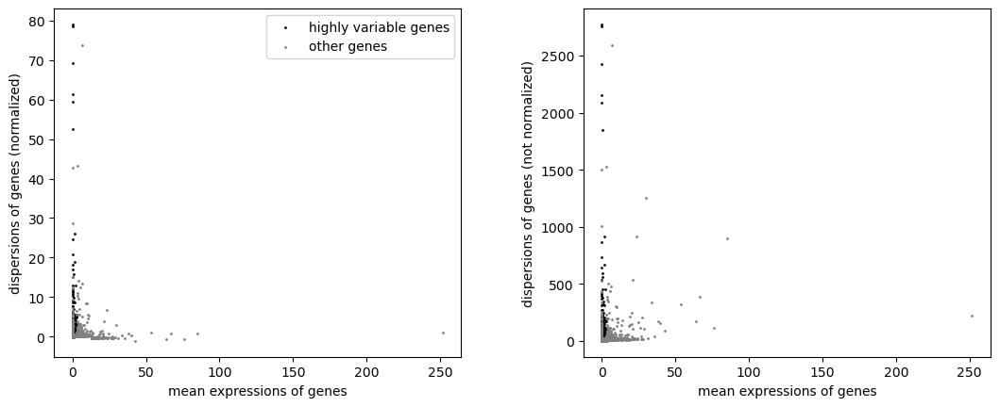

In [8]:
sc.pp.recipe_seurat(
    mouse,
    plot=True
)

In [13]:
sc.tl.pca(
    mouse,
    svd_solver='arpack'
)

In [15]:
sc.pp.neighbors(
    mouse,
    n_pcs=50
)

In [16]:
sc.tl.umap(
    mouse
)

/home/dwm269/miniconda3/envs/scm2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/scm2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


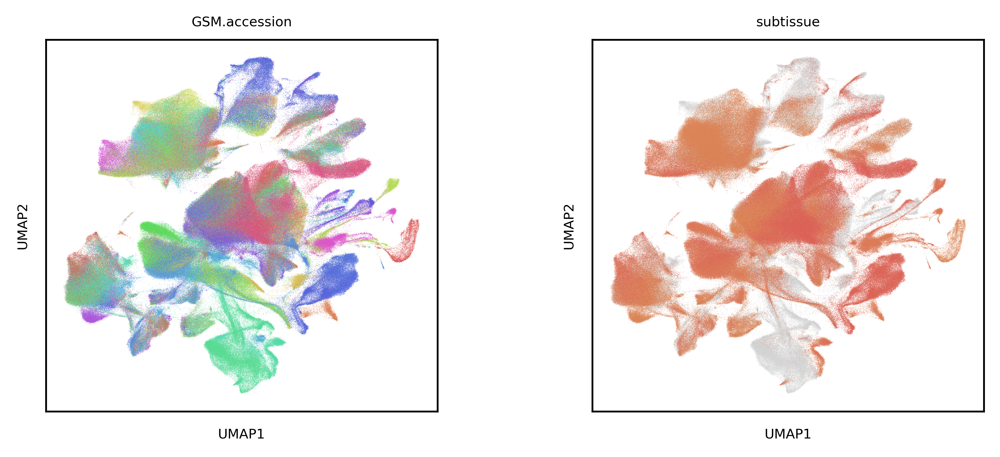

In [41]:
sc.set_figure_params(
    figsize=(3,3),
    fontsize=6,
    transparent=True,
    dpi=300
)

sc.pl.umap(
    mouse,
    legend_loc=None, #"on data"
    palette=sns.color_palette(
        "hls", 
        len(mouse.obs["GSM.accession"].unique())
    ),
    color=["GSM.accession","subtissue"]
)

Repeat w/ human dataset...

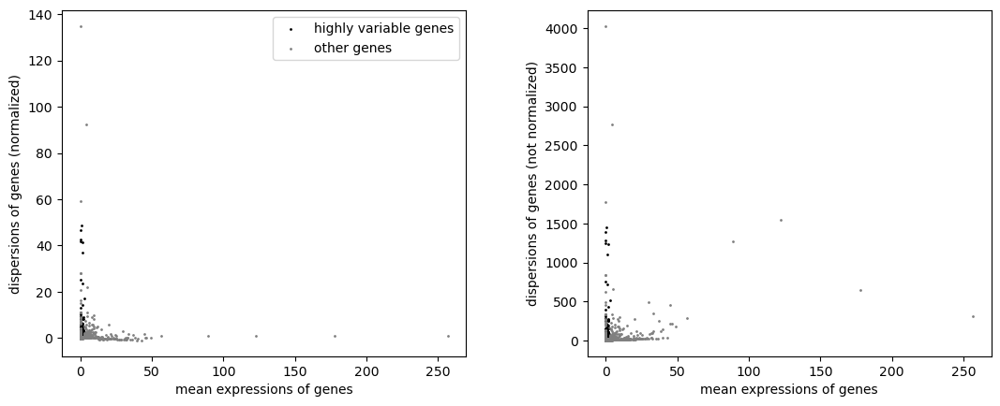

In [18]:
sc.pp.recipe_seurat(
    human,
    plot=True
)

In [19]:
sc.tl.pca(
    human,
    svd_solver='arpack'
)

In [33]:
sc.pp.neighbors(
    human,
    n_pcs=50
)

In [35]:
sc.tl.umap(
    human
)

/home/dwm269/miniconda3/envs/scm2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/scm2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


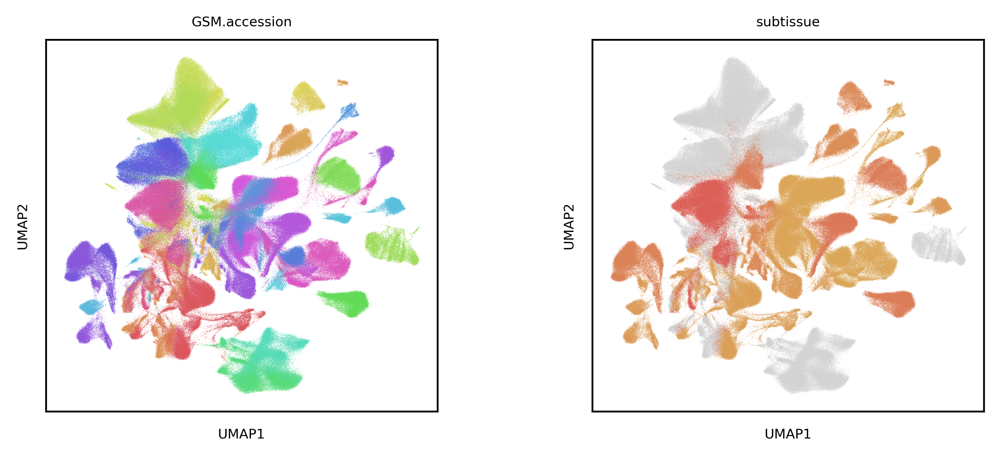

In [40]:
sc.set_figure_params(
    figsize=(3,3),
    fontsize=6,
    transparent=True,
    dpi=300
)

sc.pl.umap(
    human,
    legend_loc=None, # "right margin", #"on data"
    palette=sns.color_palette(
        "hls", 
        len(human.obs["GSM.accession"].unique())
    ),
    color=["GSM.accession","subtissue"]
)

Export datasets

In [42]:
mouse.write_h5ad(
    "data/atlas/mus_musculus_pp.h5ad"
)

In [43]:
human.write_h5ad(
    "data/atlas/homo_sapiens_pp.h5ad"
)